# Vibrations Everywhere
## The mathematics of waves - demonstration in code

<img src="img/SqWaveAnimation.gif">

### We are going to investigate the manipulation of the Fourier series of different signals, and take a look (or listen) to the results
...but first we must introduce some python and some basics. Don't worry about this next little bit - it's just some housekeeping and installing of libraries.

In [1]:
%matplotlib inline
# Load our math libraries
import math
import numpy as np
import scipy.fftpack
from scipy import misc

# Load plotting and graphics libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Load sound libraries
import librosa
import librosa.display
import IPython.display as ipd
import pdb

# Some commands to do with plotting
sns.set_style('whitegrid') # Set the plot backgrounds to white
import matplotlib.colors as mcolors
def_colour = mcolors.TABLEAU_COLORS['tab:blue']

## Discrete signals

In reality on computers, we use discrete signals: signals that are sampled at regular intervals.

| Continuous signal | Sampled signal (or "discrete signal") |
|:-:|:-:|
| ![Continuous](img/fig2.1.gif) | ![Sampled](img/fig2.2.gif) |

These discretely sampled signals are just saved as sequences (or arrays) of numbers, often between -1.0 and 1.0, i.e.
```
signal = [0.1, 0.23, 0.34, 0.13, -0.4, -0.46, ...]
```
Each number in the sequnce is known as a __sample__. Typically a sound is sampled at 48,000 Hz, that is we have 48,000 sampled values of the signal PER SECOND of sound. This is known as the __sampling rate__.

# An example: let's load a sound

## Our test case is some calypso music.

Sample rate of our sound: 48000


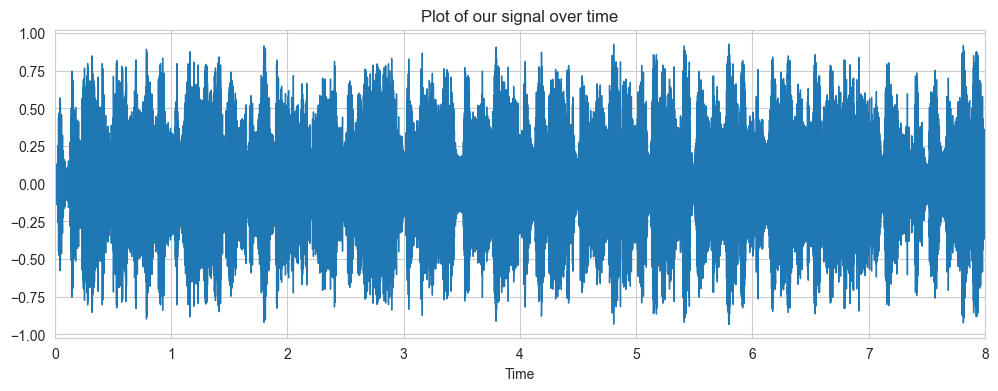

In [2]:
# Load the sound in to an array called "calypso"
calypso, sample_rate = librosa.load('audio/calypso.wav', sr=48000)

print('Sample rate of our sound: ' + str(sample_rate))

# Plot the sound wave
plt.figure(figsize=(12, 4))
librosa.display.waveshow(calypso, sr=sample_rate, color=def_colour)
plt.title('Plot of our signal over time')
plt.xlim([0,8])
plt.show()

ipd.Audio(calypso, rate=sample_rate)

### And let's look closer at the waveform

Length of calypso array = 386711


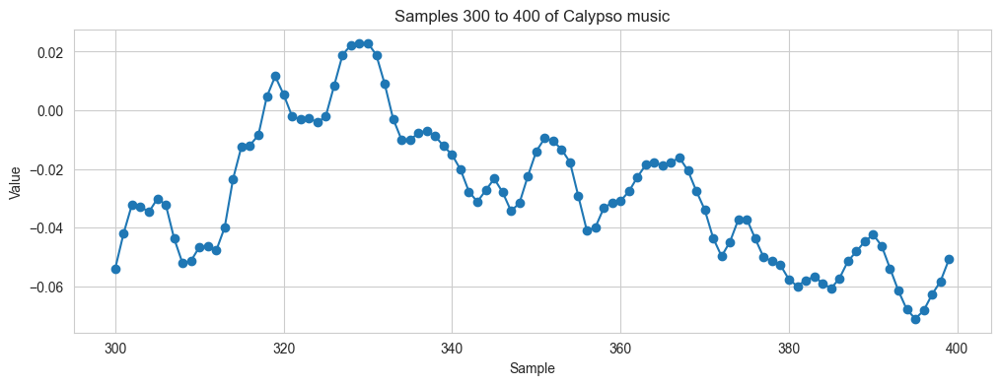

Samples 300 to 320 of Calypso music: 

[-0.05400085 -0.04197693 -0.03208923 -0.0328064  -0.03474426 -0.03019714
 -0.03215027 -0.04374695 -0.05220032 -0.05137634 -0.0466156  -0.04634094
 -0.0478363  -0.03996277 -0.02336121 -0.0123291  -0.01194763 -0.00849915
  0.00456238  0.01158142]


In [3]:
print('Length of calypso array =', len(calypso))

plt.figure(figsize=(12, 4))
plt.plot(range(300,400), calypso[300:400], marker='o') # calypso[300:400] selects the array elements from sample 300 to 400
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Samples 300 to 400 of Calypso music')
plt.show()

print('Samples 300 to 320 of Calypso music: \n')
print(calypso[300:320])


## A little about arrays in Python

The variable ```calypso``` is actually an _array_ in Python - a list of numbers. This is a common data structure across all programming languages. Python is good at dealing with arrays.

Here's a few basics about working with arrays.

#### We can get the length of the array (the number of different values it stores):

In [4]:
print('Length of calypso array =', len(calypso))

Length of calypso array = 386711


**We can select parts of the array between any index**

(as long as the indices are between 0 and the length of the array)

In [5]:
print('calypso[0:5] =', calypso[0:5])
print('calypso[2:4] =', calypso[2:4])

calypso[0:5] = [0.0748291  0.06806946 0.06086731 0.05366516 0.04682922]
calypso[2:4] = [0.06086731 0.05366516]


**We can create arrays that have certain values**

The code below makes an array ```a = [0 1 2 3 4 5 6 7 8 9] ``` and ```b = [0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9]```

In [6]:
a = np.arange(0, 10)
print('a =', a, '\n')

b = np.linspace(0.0, 1.0, 10, endpoint=False)
print('b =', b, '\n')

a = [0 1 2 3 4 5 6 7 8 9] 

b = [0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9] 



**And we can do basic arithmetic**

In [7]:
print('a+b =', a+b, '\n')
print('2*b =', 2*b, '\n')

a+b = [0.  1.1 2.2 3.3 4.4 5.5 6.6 7.7 8.8 9.9] 

2*b = [0.  0.2 0.4 0.6 0.8 1.  1.2 1.4 1.6 1.8] 



**It is easy to set values using slices**

In [8]:
a[4:7] = 0
print('a =', a)

a = [0 1 2 3 0 0 0 7 8 9]


# The discrete Fourier transform (DFT)

Now lets introduce the discrete Fourier transform (DFT). Lets call our discretely sampled signal $\large\,\color{red}{f_k}$, where $\color{red}k$ is our integer index from $\color{red}0$ to $\color{red}{N-1}$ (so $N$ is the length of the signal) I.e.

$$
\large
\color{red}{
\text{Signal} = [f_0, f_1, f_2, \ldots, f_{N-1}]
}
$$

Each $\large\,\color{red}{f_k}$ is simply a number that represents the amount of signal at that time.

Here we again need a __cosine__ element as well as a __sine__ element
$$
\large
\color{red}{f_k} \,=\, \color{blue}{a_0} + \color{blue}{a_1} \cos\left(\frac{2 \pi k}{N} \right) + \color{blue}{b_1} \sin\left(\frac{2 \pi k}{N} \right) + \color{blue}{a_2} \cos\left(\frac{2 \pi 2 k}{N} \right) + \color{blue}{b_2} \sin\left(\frac{2 \pi 2 k}{N} \right) + \color{blue}{a_3} \cos\left(\frac{2 \pi 3 k}{N} \right) + \color{blue}{b_3} \sin\left(\frac{2 \pi 3 k}{N} \right)\ldots
$$
The values $\large\,\color{blue}{a_n}$ and $\large\,\color{blue}{b_n}$ are the Fourier coefficients. We will discuss how they're calculated later!
<!-- , calculate using>
<!--$$
\large \begin{aligned}
\color{blue}{a_n} \,=\, \frac 1 N \sum_{k=0}^{N-1} \, \color{red}{f_k} \, \cos\left(\frac{2 \pi k n}{N} \right) \\
\color{blue}{b_n} \,=\, \frac 1 N \sum_{k=0}^{N-1} \, \color{red}{f_k} \, \sin\left(\frac{2 \pi k n}{N} \right) 
\end{aligned}
$$
>

In [9]:
def discrete_fourier_transform(signal):
    # "signal" contains the f_k
    fourier_transform = scipy.fftpack.fft(signal)

    a_n = np.real(fourier_transform[:len(fourier_transform) // 2 + 1])
    b_n = np.imag(fourier_transform[:len(fourier_transform) // 2 + 1])
    
    return a_n, b_n
    
def inverse_discrete_fourier_transform(a_n, b_n):
    cos_c = np.append(a_n, a_n[1:][::-1])
    sin_c = np.append(b_n, -b_n[1:][::-1])
    
    fourier_transform = np.vectorize(complex)(cos_c, sin_c)
    
    signal = np.real(scipy.fftpack.ifft(fourier_transform))
    return signal

## Lets try applying the Fourier transform and then inverting it...

In [10]:
# Calculate the a_n and b_n Fourier coefficients
a_n, b_n = discrete_fourier_transform(calypso)

# Reconstruct the sound from those coefficients
calypso_recon = inverse_discrete_fourier_transform(a_n, b_n)

# Now lets try playing the reconstruced sound!
ipd.Audio(calypso_recon, rate=sample_rate)

## Plotting the Fourier transform

We calculate the "intensity" of the Fourier transform at $n$ with 
$$
\large
\text{Intensity of Fourier transform at }n = \sqrt{a_n^2 + b_n^2}
$$

The index $n$ corresponds to certain physical __frequency__ of sound in Hertz. We can calculate it using

$$
\large
\text{Frequency at $n$ (in Hz)} = \frac{n \times \text{Sample rate} }{\text{Number of samples}}
$$

In [11]:
def plot_dft_by_hz(freqs, a_n, b_n, lo_hz, hi_hz):
    
    plt.figure(figsize=(12, 4))
    
    plt.plot(freqs, np.sqrt(a_n**2 + b_n**2), lw=1)
    plt.title(r'Intensity of Fourier transform between {0} Hz and {1} Hz'.format(round(lo_hz), round(hi_hz)))
    plt.xlim([lo_hz, hi_hz])
    plt.xlabel('Frequency (Hz)')
    plt.ylabel(r'Intensity of Fourier transform, $\sqrt{{ a_n^2 + b_n^2 }}$')
    plt.show()

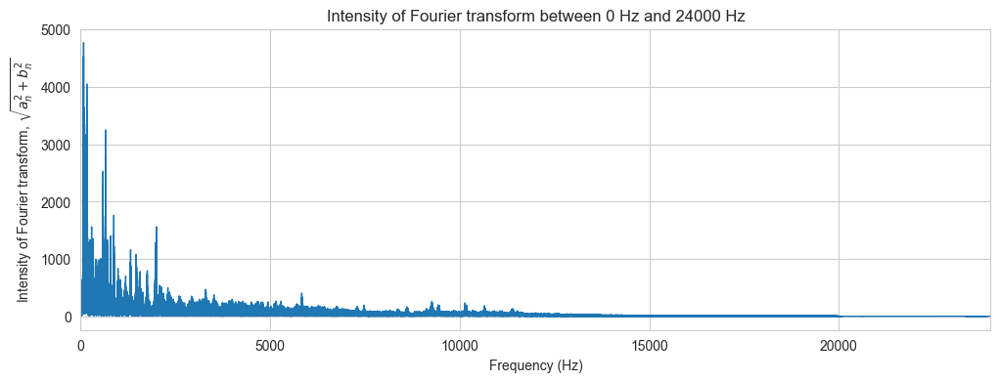

In [12]:
freqs = (sample_rate/2) * np.arange(0.0, 1.0, 2.0/len(calypso_recon))

plot_dft_by_hz(freqs, a_n, b_n, freqs[0], freqs[-1])

### Lets look closer at the Fourier transform from 100 Hz to 500 Hz

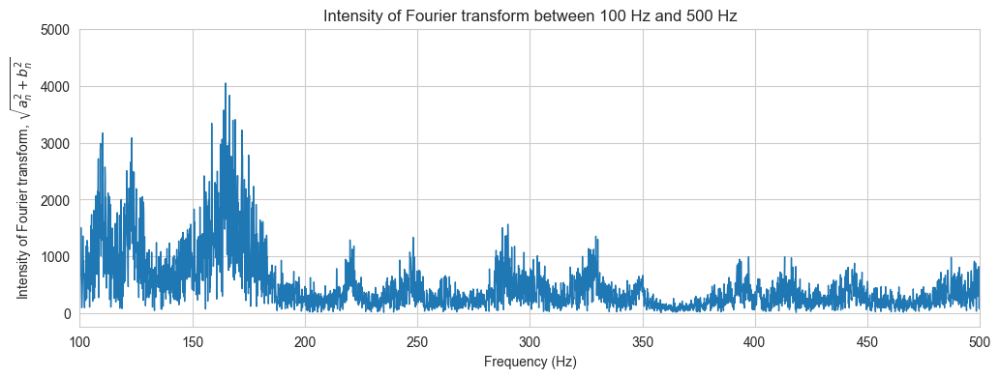

In [13]:
plot_dft_by_hz(freqs, a_n, b_n, 100, 500)

### Hmmm... The musical note A is at 110 Hz and E is at 164.814 Hz. 
Those frequencies seem to have large intensities in the Fourier transform! Lets listen to those tones...

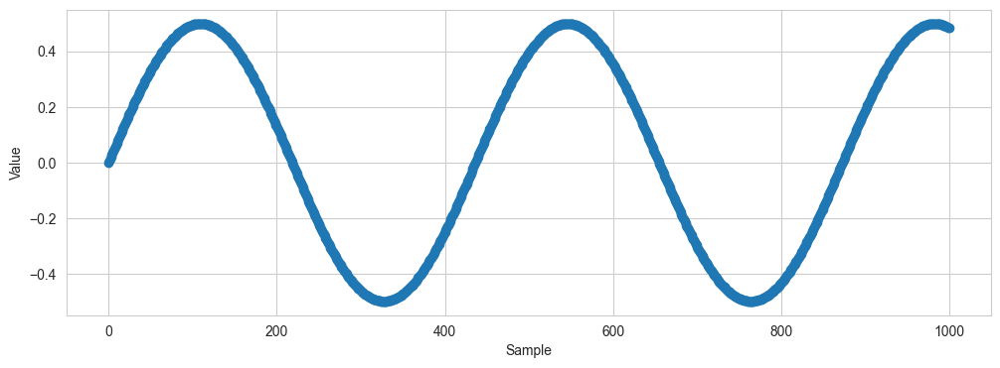

In [14]:
t = np.linspace(0, 1.0, sample_rate)

A_freq = 110

# Create a signal that is just the sinusoid with a frequency of 110 Hz
A_tone = 0.5 * np.sin(2 * math.pi * A_freq * t)

# Lets plot the first 1000 samples of the signal
plt.figure(figsize=(12, 4))
plt.plot(range(1000), A_tone[:1000], marker='o') 
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# And listen to it
ipd.Audio(A_tone, rate=sample_rate)


In [16]:
E_freq = 164.814

# Create a signal that is just the sinusoid with a frequency of 164.814 Hz
E_tone = 0.5 * np.sin(2 * math.pi * E_freq * t)
ipd.Audio(E_tone, rate=sample_rate)

In [15]:
ipd.Audio(calypso, rate=sample_rate)

## Filtering - setting Fourier values to 0

### First we try a "low pass filter"

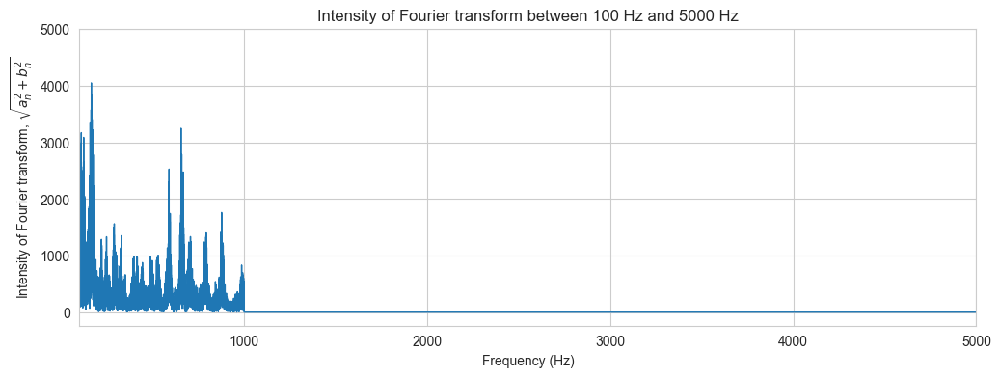

In [18]:
a_n_lp, b_n_lp = discrete_fourier_transform(calypso)

a_n_lp[freqs > 1000.0] = 0
b_n_lp[freqs > 1000.0] = 0

plot_dft_by_hz(freqs, a_n_lp, b_n_lp, 100, 5000)

In [20]:
calypso_lp = inverse_discrete_fourier_transform(a_n_lp, b_n_lp)
ipd.Audio(calypso_lp, rate=sample_rate)

### How does the filtered signal look compared to the other signal? 

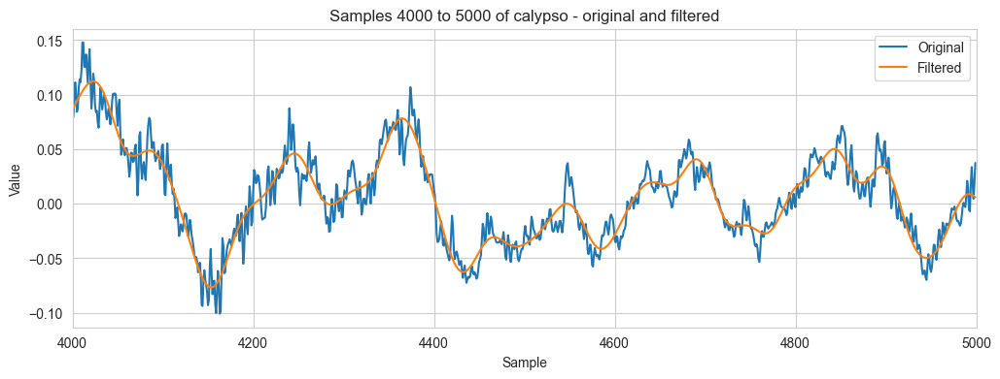

In [21]:
n0=4000
n1=5000

plt.figure(figsize=(12, 4))
plt.plot(range(n0,n1), calypso[n0:n1], label='Original') # ac_dc[0:100] selects the array elements from 0 to 100
plt.plot(range(n0,n1), calypso_lp[n0:n1], label='Filtered') # ac_dc[0:100] selects the array elements from 0 to 100
plt.xlabel('Sample')
plt.xlim([n0,n1])
plt.ylabel('Value')
plt.title('Samples {0} to {1} of calypso - original and filtered'.format(n0, n1))
plt.legend()
plt.show()

### Now we try a "high pass filter"

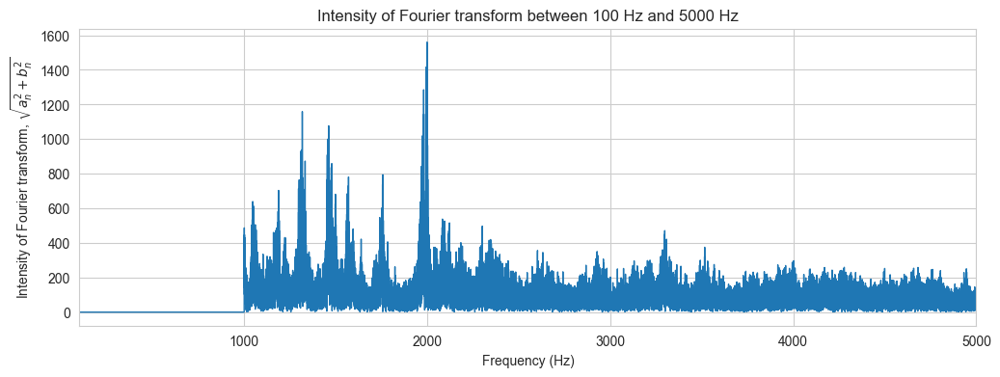

In [ ]:
a_n_hp, b_n_hp = discrete_fourier_transform(calypso)

a_n_hp[freqs < 1000.0] = 0
b_n_hp[freqs < 1000.0] = 0

plot_dft_by_hz(freqs, a_n_hp, b_n_hp, 100, 5000)

In [ ]:
calypso_hp = inverse_discrete_fourier_transform(a_n_hp, b_n_hp)
ipd.Audio(calypso_hp, rate=sample_rate)

### Finally a band-pass filter

In [38]:
a_n_bp, b_n_bp = discrete_fourier_transform(calypso)

a_n_bp[(freqs < 500) | (freqs > 1000.0)] = 0
b_n_bp[(freqs < 500) | (freqs > 1000.0)] = 0

calypso_bp = inverse_discrete_fourier_transform(a_n_bp, b_n_bp)
ipd.Audio(calypso_bp, rate=sample_rate)

# Home-made mp3 Compression

What if we discarded all the values of the Fourier transform that were close enough to 0, and kept only the larger values?

E.g. if we had

|$a_0$ | $a_1$ | $a_2$ | $a_3$ | $a_4$ | $a_5$ | $a_6$ | $a_7$ | $\ldots$ | 
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
| 0.8 | -0.05 | 0.5 | 0.09 | -0.93 | 0.77 | -0.01 | 0.02|

If we only stored values that had absolute value larger than 0.1 (and their corresponding indices)

|$a_0$  | $a_2$ | $a_4$ | $a_5$ | | $\ldots$ | 
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
| 0.8 | 0.5 | -0.93 | 0.77 | 

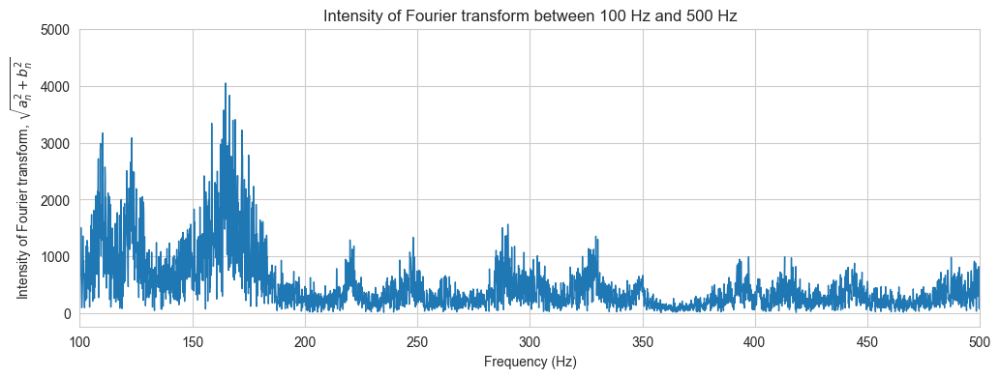

In [39]:
plot_dft_by_hz(freqs, a_n, b_n, 100, 500)
calypso_recon = inverse_discrete_fourier_transform(a_n, b_n)
ipd.Audio(calypso_recon, rate=sample_rate)

### Now lets "compress" the signal by setting $a_n=0$ and $b_n=0$ if $\sqrt{a_n^2 + b_n^2}$ is smaller than some threshold
The threshold here, called ```cutoff_height``` is set to 
$$
\texttt{cutoff\_height} = 0.05 \times \max_{0 \le n < N} \sqrt{a_n^2 + b_n^2}
$$
We can play with the value of 0.05 to see different results. Larger values will remove more components and hence compress more. Smaller values will compress less.

Compressed Fourier transform
File size would be about 2.3635% of original


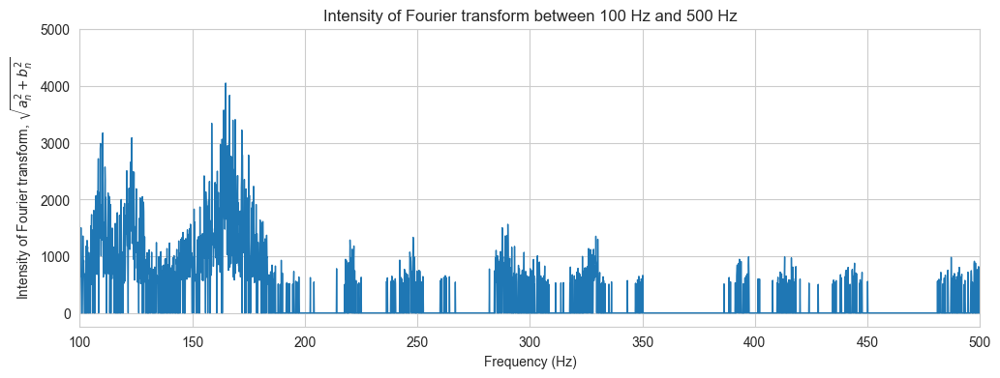

In [44]:
dft_int = np.sqrt(a_n**2 + b_n**2)

cutoff_height = 500

a_n_comp = np.copy(a_n)
b_n_comp = np.copy(b_n)
a_n_comp[dft_int < cutoff_height] = 0
b_n_comp[dft_int < cutoff_height] = 0

print('Compressed Fourier transform')
print('File size would be about {0}% of original'.format(round(2*100*sum(dft_int > cutoff_height) / len(dft_int),4)))
plot_dft_by_hz(freqs, a_n_comp, b_n_comp, 100, 500)

calypso_comp = inverse_discrete_fourier_transform(a_n_comp, b_n_comp)
ipd.Audio(calypso_comp, rate=sample_rate)

# Images and blurring

Just as sounds are signals, so are images.

Image size (in pixels): (667, 1000)


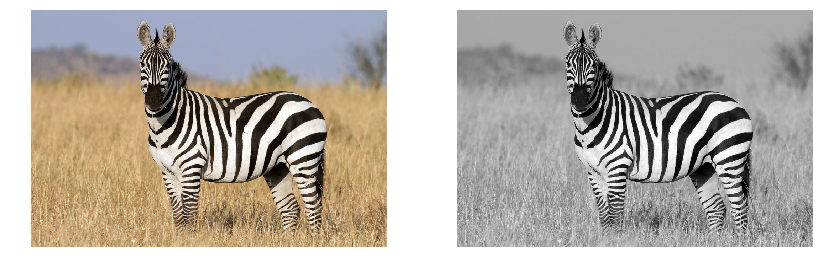

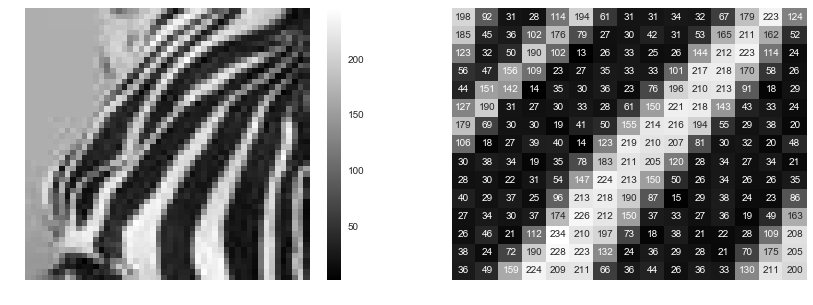

In [61]:
zebra = plt.imread('img/zebra.jpg')

def rgb2gray(rgb):
    return np.int32(np.dot(rgb[...,:3], [0.299, 0.587, 0.114]))

zeb_bw = rgb2gray(zebra)
print('Image size (in pixels):', zeb_bw.shape)

fig = plt.figure(figsize=(14, 5))
fig.add_subplot(1,2,1)
plt.imshow(zebra)
plt.axis('off')

fig.add_subplot(1,2,2)
plt.imshow(zeb_bw, cmap=plt.cm.gray)
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(14, 5))
fig.add_subplot(1,2,1)
sns.heatmap(zeb_bw[100:150, 300:350], cmap=plt.cm.gray)
plt.axis('off')

fig.add_subplot(1,2,2)
sns.heatmap(zeb_bw[120:135, 320:335], annot=True, cmap=plt.cm.gray, cbar=False, fmt='d')
plt.axis('off')

plt.show()

# The discrete Fourier transform in two dimensions

Now we have an image of size $N\times M$ with two indices, we write $\,\large\color{red}{f_{k,\ell}}$, where $k$ goes between $0$ and $N-1$, and $\ell$ between $0$ and $M-1$.

And we are going to obtain discrete Fourier coefficients that have __two indices__, $\,\large\color{blue}{a_{n,m}}$ and $\,\large\color{blue}{b_{n,m}}$

$$
\large
\color{red}{f_{k,\ell}} \,=\, \sum_{n=0}^{N-1} \sum_{m=0}^{M-1} \,\color{blue}{a_{n,m}} \cos\left(2 \pi \left(\frac{k n}{N} + \frac{\ell m}{M}\right) \right) + \color{blue}{b_{n,m}} \, \sin\left(2 \pi \left(\frac{k n}{N} + \frac{\ell m}{M}\right) \right)
$$
where we calculate the coefficients $\color{blue}{a_n}$ and $\color{blue}{b_n}$ using
$$
\large
\begin{aligned}
\color{blue}{a_{n,m}} \,=\, \frac{1}{MN} \sum_{k=0}^{N-1} \, \color{red}{f_{k,\ell}} \, \cos\left(2 \pi \left(\frac{k n}{N} + \frac{\ell m}{M}\right) \right) \\
\color{blue}{b_{n,m}} \,=\, \frac{1}{MN} \sum_{k=0}^{N-1} \, \color{red}{f_{k,\ell}} \, \sin\left(2 \pi \left(\frac{k n}{N} + \frac{\ell m}{M}\right)\right) 
\end{aligned}
$$

Lets plot some examples of the sines and cosines in 2D

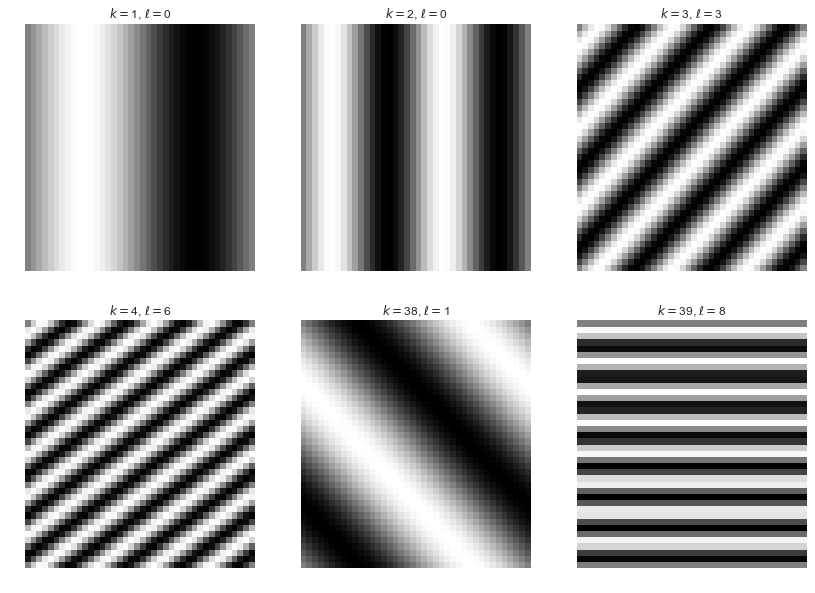

In [62]:
N, M = (40, 40)

x, y = np.meshgrid(np.linspace(0, 1, M), np.linspace(0, 1, N))

fig = plt.figure(figsize=(14, 10))
kls = [[1,0], [2,0], [3,3], [4,6], [38, 1], [39,8]]
for i,(k,l) in enumerate(kls):
    fig.add_subplot(2,3,i+1)
    sns.heatmap(np.sin(2*math.pi*(k*x + l*y)), cmap=plt.cm.gray, cbar=False)
    plt.title(r'$k=${0}, $\ell=${1}'.format(k,l))
    plt.axis('off')

plt.show()

In [63]:
def dft2(signal):
    # the signal is the f_k
    ft = scipy.fftpack.fft2(signal)

    a_nm = np.real(ft)
    b_nm = np.imag(ft)

    return a_nm, b_nm
    
def inverse_dft2(a_nm, b_nm):
    ft = np.vectorize(complex)(a_nm, b_nm)
    
    signal = np.real(scipy.fftpack.ifft2(ft))
    return signal

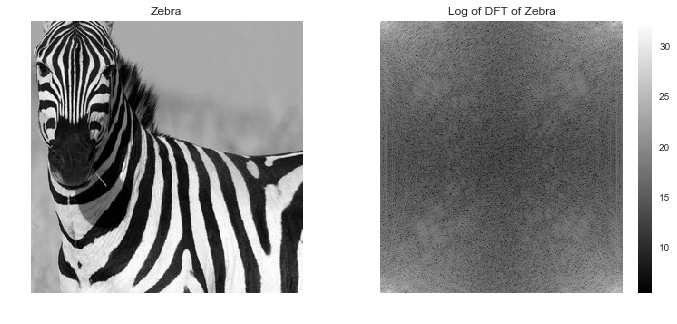

In [64]:
z = zeb_bw[100:400, 300:600]

(N,M) = z.shape

a_mn, b_mn = dft2(z)

fig = plt.figure(figsize=(12, 5))
fig.add_subplot(1,2,1)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Zebra')
plt.axis('off')

fig.add_subplot(1,2,2)
sns.heatmap(np.log(a_mn**2 + b_mn**2), cmap=plt.cm.gray)
plt.title('Log of DFT of Zebra')
plt.axis('off')
plt.show()

### First we try a "low pass" filter

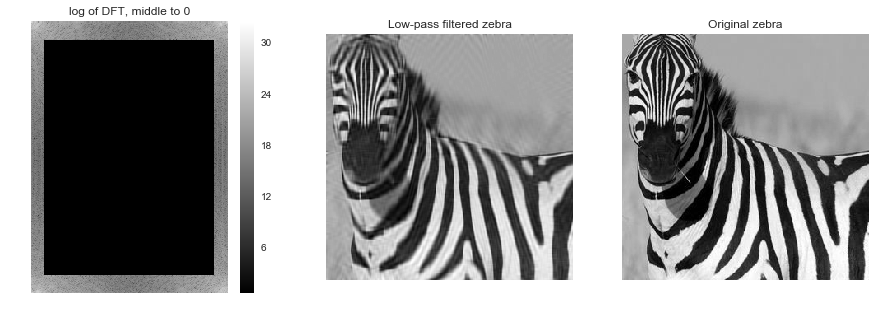

In [65]:
a_mn_lp = np.copy(a_mn)
b_mn_lp = np.copy(b_mn)

e = 20
a_mn_lp[e:-e, e:-e] = 1
b_mn_lp[e:-e, e:-e] = 1

z_lp = inverse_dft2(a_mn_lp, b_mn_lp)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1,3,1)
sns.heatmap(np.log(a_mn_lp**2 + b_mn_lp**2), cmap=plt.cm.gray)
plt.title('log of DFT, middle to 0')
plt.axis('off')

fig.add_subplot(1,3,2)
plt.imshow(z_lp, cmap=plt.cm.gray)
plt.title('Low-pass filtered zebra')
plt.axis('off')

fig.add_subplot(1,3,3)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Original zebra')
plt.axis('off')

plt.show()

Note above how much information we remove yet retain the recognizable image of a zebra!

### Now a "high pass" filter

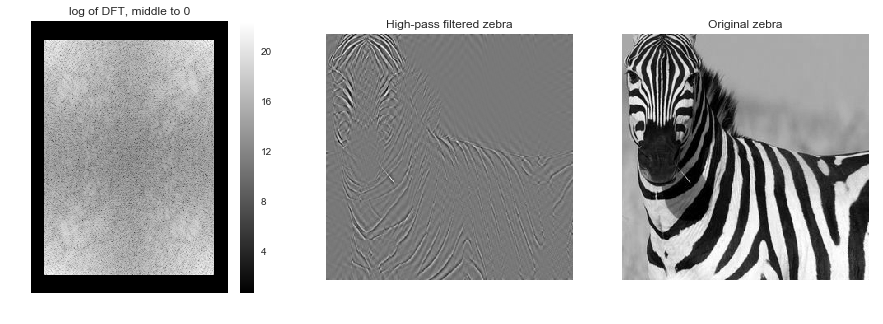

In [66]:
a_mn_hp = np.copy(a_mn)
b_mn_hp = np.copy(b_mn)

a_mn_hp[:e,:] = a_mn_hp[-e:,:] = a_mn_hp[:,:e] = a_mn_hp[:,-e:] = 1
b_mn_hp[:e,:] = b_mn_hp[-e:,:] = b_mn_hp[:,:e] = b_mn_hp[:,-e:] = 1

z_hp = inverse_dft2(a_mn_hp, b_mn_hp)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1,3,1)
sns.heatmap(np.log(a_mn_hp**2 + b_mn_hp**2), cmap=plt.cm.gray)
plt.title('log of DFT, middle to 0')
plt.axis('off')

fig.add_subplot(1,3,2)
plt.imshow(z_hp, cmap=plt.cm.gray)
plt.title('High-pass filtered zebra')
plt.axis('off')

fig.add_subplot(1,3,3)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Original zebra')
plt.axis('off')

plt.show()

### Now a low-pass filter, but removing the middle circle of radius $r$, rather than a square

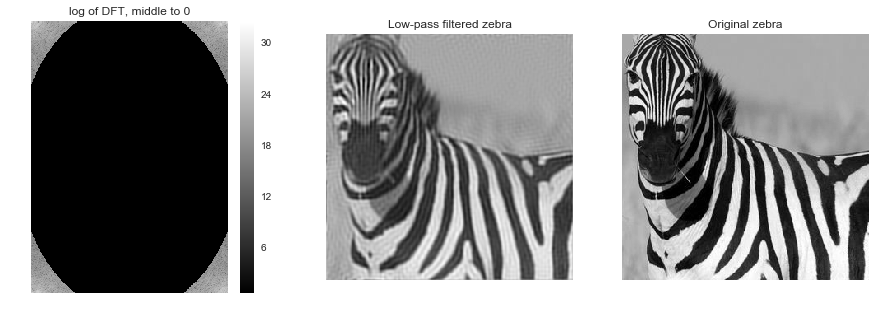

In [67]:
a_mn_lp = np.copy(a_mn)
b_mn_lp = np.copy(b_mn)

r = 170
y,x = np.ogrid[-N/2:N/2, -M/2:M/2]
mask = x*x + y*y <= r*r

a_mn_lp[mask] = 1
b_mn_lp[mask] = 1

z_lp = inverse_dft2(a_mn_lp, b_mn_lp)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1,3,1)
sns.heatmap(np.log(a_mn_lp**2 + b_mn_lp**2), cmap=plt.cm.gray)
plt.title('log of DFT, middle to 0')
plt.axis('off')

fig.add_subplot(1,3,2)
plt.imshow(z_lp, cmap=plt.cm.gray)
plt.title('Low-pass filtered zebra')
plt.axis('off')

fig.add_subplot(1,3,3)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Original zebra')
plt.axis('off')

plt.show()

### ...and the same for a high-pass

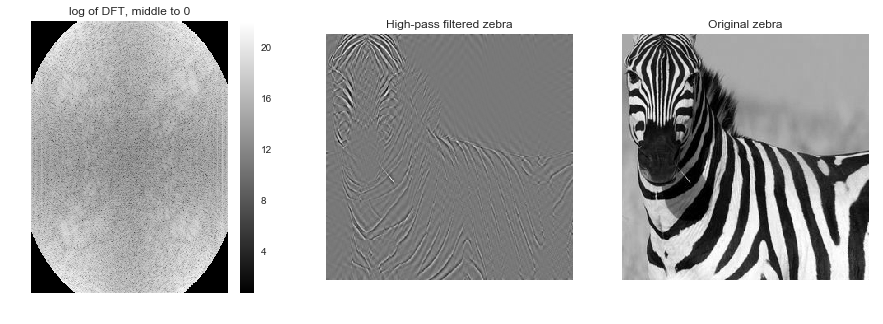

In [68]:
a_mn_hp = np.copy(a_mn)
b_mn_hp = np.copy(b_mn)

r = 170
y,x = np.ogrid[-N/2:N/2, -M/2:M/2]
mask = x*x + y*y <= r*r

a_mn_hp[~mask] = 1
b_mn_hp[~mask] = 1

z_lp = inverse_dft2(a_mn_hp, b_mn_hp)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1,3,1)
sns.heatmap(np.log(a_mn_hp**2 + b_mn_hp**2), cmap=plt.cm.gray)
plt.title('log of DFT, middle to 0')
plt.axis('off')

fig.add_subplot(1,3,2)
plt.imshow(z_hp, cmap=plt.cm.gray)
plt.title('High-pass filtered zebra')
plt.axis('off')

fig.add_subplot(1,3,3)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Original zebra')
plt.axis('off')

plt.show()